# This notebook trains a model with an additional 1000 most confusing samples from outside the OSFL habitat

wandb description

In [1]:
description = "efficientnet_b0 pretrained True 20 epoch 1971 focal present, 1970 human labelled present and 3000 human labelled absent, 1000 out of habitat absent."

In [2]:
# !pip install wandb
# ! pip install wandb --upgrade

In [3]:
%env PYTORCH_ENABLE_MPS_FALLBACK 0

env: PYTORCH_ENABLE_MPS_FALLBACK=0


In [4]:
# autoreload
%load_ext autoreload
%autoreload 2

In [5]:
!env |grep MPS


PYTORCH_ENABLE_MPS_FALLBACK=0


In [6]:
!wandb login

wandb: Currently logged in as: mgallimore88. Use `wandb login --relogin` to force relogin


In [7]:
# imports
from pathlib import Path
import sys
import pandas as pd
BASE_PATH = Path.cwd().parent.parent
sys.path.append(str(BASE_PATH))
from src.utils import display_all, plot_locations, show_sample_from_df, clean_confidence_cats, get_recording_durations, plot_metrics_across_thresholds, get_recording_durations
import src.data
import src.data.build
import opensoundscape as opso
from opensoundscape.preprocess.utils import show_tensor, show_tensor_grid
import numpy as np
import hashlib
model_save_path = BASE_PATH / 'models'
import matplotlib.pyplot as plt
import glob
import sklearn
import ipywidgets as widgets
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:18: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [8]:
# Set the data path
data_path = Path.cwd().parent.parent / "data"

# Log some hyperparameters

In [9]:
n_samples_per_class = 1700
one_output_neuron = True
random_seed = 42
learning_rate = 0.01
epochs=20
bandpass = False

In [10]:
# train_dataset, valid_dataset, _, _ = src.data.build.dataset_from_df(train_df, target_species = "OSFL", download_n=0, seed=random_seed)

In [11]:
# train_df = train_dataset.label_df
# valid_df = valid_dataset.label_df

# # train_df.to_pickle(data_path / "interim" / "train_set" / "train_df.pkl")
# # valid_df.to_pickle(data_path / "interim" / "valid_set" / "valid_df.pkl")

# # optionally load these from disk instead
train_df = pd.read_pickle(data_path / "interim" / "train_set" / "verified_full_train_set.pkl")
valid_df = pd.read_pickle(data_path / "interim" / "valid_set" / "valid_df_verified.pkl")

focal_df = pd.read_pickle(data_path / "interim" / "train_and_valid_set" / "focal_osfls_thresh_0.98_ngen_2601.pkl")

other_habitats_df = pd.read_pickle(data_path / "interim" / "train_and_valid_set" / "other_habitats_label_df_verified.pkl")
other_habitats_df.rename(columns={"present": "target_presence"}, inplace=True)


train_df.confidence_cat.value_counts()


confidence_cat
0     41658
3      1437
2       494
5       331
1       319
4        77
6        50
33        1
Name: count, dtype: int64

In [12]:
other_habitats_df.confidence_cat.value_counts()

confidence_cat
0    167274
3      1012
5       103
2        40
1         2
Name: count, dtype: int64

In [13]:
focal_df[['target_presence']] = 1.0
focal_df = focal_df[["target_presence"]]
focal_df.head()

target_presence
file                                               start_time end_time                 
../../data/raw/recordings/OSFL/recording-555135... 6.0        9.0                   1.0
                                                   7.5        10.5                  1.0
                                                   13.5       16.5                  1.0
                                                   15.0       18.0                  1.0
                                                   24.0       27.0                  1.0

In [14]:
valid_df.value_counts()

target_absence  target_presence  confidence_cat
1.0             0.0              0                 9947
0.0             1.0              2                  360
                                 3                  357
                                 1                  296
                                 4                   28
                                 0                    2
Name: count, dtype: int64

In [15]:
other_habitats_df.head()

target_presence  \
file                                               start_time end_time                    
../../data/raw/recordings/OSFL_other_habitats/r... 0.0        3.0                   0.0   
                                                   1.5        4.5                   0.0   
                                                   3.0        6.0                   0.0   
                                                   4.5        7.5                   0.0   
                                                   6.0        9.0                   0.0   

                                                                        probability  \
file                                               start_time end_time                
../../data/raw/recordings/OSFL_other_habitats/r... 0.0        3.0          0.073692   
                                                   1.5        4.5          0.152632   
                                                   3.0        6.0          0.090518   
                                                   4.5        7.5          0.133722   
                                                   6.0        9.0          0.155343   

                                                                            loss  \
file                                               start_time end_time             
../../data/raw/recordings/OSFL_other_habitats/r... 0.0        3.0       0.073692   
                                                   1.5        4.5       0.152632   
                                                   3.0        6.0       0.090518   
                                                   4.5        7.5       0.133722   
                                                   6.0        9.0       0.155343   

                                                                        confidence_cat  
file                                               start_time end_time                  
../../data/raw/recordings/OSFL_other_habitats/r... 0.0        3.0                    0  
                                                   1.5        4.5                    0  
                                                   3.0        6.0                    0  
                                                   4.5        7.5                    0  
                                                   6.0        9.0                    0

In [16]:
train_df = clean_confidence_cats(train_df)
valid_df = clean_confidence_cats(valid_df)
other_habitats_df = clean_confidence_cats(other_habitats_df, clean_unchecked=True)
train_df["target_absence"] = 1-train_df["target_presence"]
valid_df["target_absence"] = 1-valid_df["target_presence"]
other_habitats_df["target_absence"] = 1-other_habitats_df["target_presence"]
train_df = train_df[["target_absence", "target_presence"]]
valid_df = valid_df[["target_absence", "target_presence"]]
other_habitats_df = other_habitats_df[["target_absence", "target_presence"]]

In [17]:
train_df.value_counts(), valid_df.value_counts(), other_habitats_df.value_counts()

(target_absence  target_presence
 1.0             0.0                41770
 0.0             1.0                 1784
 Name: count, dtype: int64,
 target_absence  target_presence
 1.0             0.0                9947
 0.0             1.0                 387
 Name: count, dtype: int64,
 target_absence  target_presence
 1.0             0.0                1012
 0.0             1.0                 103
 Name: count, dtype: int64)

# Remove invalid samples from invalid_samples.log

In [18]:
# read the contents of invalid_samples.log
with open("invalid_samples.log") as f:
    invalid_samples = f.readlines()
invalid_samples = [x.strip() for x in invalid_samples]
# convert to paths
invalid_samples = [Path(x) for x in invalid_samples]
# remove the invalid samples from the training set
train_df = train_df.drop(invalid_samples)

/var/folders/hy/36n7jr6x3h74ddx507dc12_00000gn/T/ipykernel_43396/1377274677.py:8: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  train_df = train_df.drop(invalid_samples)


# Remove any additional invalid samples 
These may be printed during model training, or found by measuring the length of recordings This method just drops the whole file from the dataframe, and is being superceded by a method which removes the clip only (below)


In [19]:
def remove_files_from_df(df: pd.DataFrame, files: list):
    ''' 
    df must be a multi-indexed DataFrame with the first level being the file path.
    files is a list of string filepaths. 
    '''
    files = [Path(f) for f in files]
    df.drop(files, inplace=True)
    return df

In [20]:
short_samples = [("../../data/raw/recordings/OSFL/recording-293782.mp3"),
("../../data/raw/recordings/OSFL/recording-294264.mp3"),
("../../data/raw/recordings/OSFL/recording-292726.mp3"),
("../../data/raw/recordings/OSFL/recording-300271.mp3"),
("../../data/raw/recordings/OSFL/recording-296664.mp3"),]
train_df = remove_files_from_df(train_df, short_samples)

/var/folders/hy/36n7jr6x3h74ddx507dc12_00000gn/T/ipykernel_43396/3185280771.py:7: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  df.drop(files, inplace=True)


In [21]:
short_focal_samples = [("../../data/raw/recordings/OSFL/recording-538292.flac"),
("../../data/raw/recordings/OSFL/recording-255624.flac"),
("../../data/raw/recordings/OSFL/recording-255625.flac"),
("../../data/raw/recordings/OSFL/recording-168894.flac"),
("../../data/raw/recordings/OSFL/recording-104311.mp3"), 
("../../data/raw/recordings/OSFL/recording-100695.flac")]
focal_df.drop(short_focal_samples, inplace=True)


/var/folders/hy/36n7jr6x3h74ddx507dc12_00000gn/T/ipykernel_43396/740663884.py:7: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  focal_df.drop(short_focal_samples, inplace=True)


In [22]:
def remove_short_clips(df):
    '''
    Removes samples from the index of a dataframe that are reported as being short during training. 

    This is done by extracting the index information from the file short_samples.log and removing the corresponding samples from the dataframe. Hence it will be broken by any changes to the format of the log.     
    '''

    # read the contents of invalid_samples.log
    with open("short_samples.log") as f:
        short_samples = f.readlines()
    lines = [x.strip().strip("Path: ") for x in short_samples]
    lines = [x.split(",") for x in lines]
    paths = [Path(x[0]) for x in lines]
    starts = [(x[1]).strip(" start_time: ").strip(" sec") for x in lines]
    starts = [float(x) for x in starts]
    ends = [(x[2]).strip(" end_time ").strip(" sec.") for x in lines]
    ends = [float(x) for x in ends]
    short_clips = list(zip(paths, starts, ends))
    short_clips_in_df = df.loc[df.index.isin(short_clips)]
    if len(short_clips_in_df) > 0:
        print("Short clips dropped from the dataframe:")
        print(short_clips_in_df)
        df.drop(short_clips_in_df.index, inplace=True)
    else:
        print("No short clips found in the dataframe.")


In [23]:
len(other_habitats_df)

1115

# Find zero length recordings in the other habitats data

In [24]:
# other_habitats_df_durations = get_recording_durations(other_habitats_df)
# min(other_habitats_df_durations)

There were no zero length recordings found in the other habitats data.

In [25]:
files = other_habitats_df.index.get_level_values(0).values
clip_df, invalid_samples = opso.utils.make_clip_df(files, clip_duration=3.0, clip_overlap=1.5, return_invalid_samples=True, raise_exceptions=True)
len(invalid_samples)

0

The recordings didn't throw any errors during preprocessing. 

In [26]:
def remove_short_recordings(df):
    '''
    Removes recordings from the index of a dataframe that generate clips which are reported as being short during training. 

    This is done by extracting the index information from the file short_samples.log and removing the corresponding samples from the dataframe. Hence it will be broken by any changes to the format of the log.     
    '''

    # read the contents of invalid_samples.log
    with open("short_samples.log") as f:
        short_samples = f.readlines()
    lines = [x.strip().strip("Path: ") for x in short_samples]
    lines = [x.split(",") for x in lines]
    paths = [Path(x[0]) for x in lines]
    short_recs = df.loc[df.index.get_level_values(0).isin(paths)]

    if len(short_recs) > 0:
        print(f"{len(short_recs)} Short recordings dropped from the dataframe:")
        print(short_recs)
        df.drop(short_recs.index, inplace=True)
    else:
        print("No short recordings found in the dataframe.")
remove_short_recordings(other_habitats_df)

46 Short recordings dropped from the dataframe:
                                                                        target_absence  \
file                                               start_time end_time                   
../../data/raw/recordings/OSFL_other_habitats/r... 16.5       19.5                 1.0   
                                                   18.0       21.0                 1.0   
                                                   21.0       24.0                 1.0   
                                                   22.5       25.5                 1.0   
                                                   57.0       60.0                 1.0   
                                                   67.5       70.5                 1.0   
                                                   105.0      108.0                1.0   
                                                   106.5      109.5                1.0   
                                                   1

In [27]:
len(other_habitats_df)

1069

Check that the labels are the same datatype between other habitats and train df

In [28]:
assert type(other_habitats_df.target_presence.iloc[0]) == type(train_df.target_presence.iloc[0])

In [29]:
invalid_samples

set()

The random seed sets the deterministic splitting of the training and validation set. Here we can check whether the splits have changed from one run to the next. 

In [30]:
# Convert the DataFrame to a hashable string
# This involves hashing each row, then concatenating the hashes, and finally hashing the concatenated hash.
train_string_to_hash = ''.join(pd.util.hash_pandas_object(train_df, index=False).astype(str))
valid_string_to_hash = ''.join(pd.util.hash_pandas_object(valid_df, index=False).astype(str))


# Use hashlib to create a hash of the entire DataFrame
train_hash_value = hashlib.sha256(train_string_to_hash.encode()).hexdigest()
valid_hash_value = hashlib.sha256(valid_string_to_hash.encode()).hexdigest()
print(train_hash_value, valid_hash_value)
# assert train_hash_value == "28029fc6efcdec044c3d4e7c9412a882bbfc680b33c966290529f7ed8c5956b2", "Training set has changed"
# assert valid_hash_value == "7ae7ebc16edad82fdc43102630d180e6fa3b4a32e44a0cc64ca70ab68ec0d1fe", "Validation set has changed"

df6b00cc6ffa4efbaca189fa4093169c5ee439cbce5703f0454eed5da8081ed3 d54f471abbc0d72e038b376de5896e0efd679391e1d531dd1b1f2f259e813d3c


In [31]:
zero_len_recordings = [Path('../../data/raw/recordings/OSFL/recording-565606.flac'),
       Path('../../data/raw/recordings/OSFL/recording-565607.flac'),
       Path('../../data/raw/recordings/OSFL/recording-565618.flac')],
drop_df = train_df.loc[zero_len_recordings]
train_df.drop(drop_df.index, inplace=True)

In [32]:
focal_df.target_presence.value_counts()

target_presence
1.0    1971
Name: count, dtype: int64

# Resample

In [33]:
## This is done explicitly taking n samples from each clip source. 

from opensoundscape.data_selection import resample

# # upsample (repeat samples) or downsample so that both classes have equal numbers of samples
# balanced_train_df = resample(train_df,n_samples_per_class=n_samples_per_class,random_state=random_seed)
balanced_valid_df = resample(valid_df,n_samples_per_class=380,random_state=random_seed)
# balanced_train_df.target_presence.value_counts(), len(balanced_train_df)

In [34]:
focal_df

target_presence
file                                               start_time end_time                 
../../data/raw/recordings/OSFL/recording-555135... 6.0        9.0                   1.0
                                                   7.5        10.5                  1.0
                                                   13.5       16.5                  1.0
                                                   15.0       18.0                  1.0
                                                   24.0       27.0                  1.0
...                                                                                 ...
../../data/raw/recordings/OSFL/recording-293120... 121.5      124.5                 1.0
                                                   124.5      127.5                 1.0
                                                   154.5      157.5                 1.0
                                                   156.0      159.0                 1.0
../../data/raw/recordings/OSFL/recording-556648... 37.5       40.5                  1.0

[1971 rows x 1 columns]

In [35]:
# Sample 1971 focal examples, 1971 human labelled present examples and 3942 human labelled absent examples for this experiment
absent = train_df[train_df.target_presence == 0]

In [36]:
from sklearn.model_selection import train_test_split

other_train, other_valid = train_test_split(other_habitats_df)
other_valid.value_counts()


target_absence  target_presence
1.0             0.0                242
0.0             1.0                 26
Name: count, dtype: int64

# Investigate why mixing in extra out of habitat samples is causing training to stall

In [37]:
present = train_df[train_df.target_presence == 1]

absent = absent.sample(3000, random_state=random_seed)
present = present.sample(1770, random_state=random_seed)

train_df = pd.concat([absent[['target_presence']], present[['target_presence']], focal_df[['target_presence']], other_train[['target_presence']].sample(500)])

# # # Remove the other habitats samples from training set to see if this is what's breaking the training 
# train_df = pd.concat([absent[['target_presence']], present[['target_presence']], focal_df[['target_presence']]])

# # # Remove the other habitats samples from training set to see if this is what's breaking the training 
# train_df = pd.concat([absent[['target_presence']], present[['target_presence']], focal_df[['target_presence']]])

train_df = train_df.sample(frac=1, random_state=random_seed)
train_df.value_counts()



target_presence
1.0                3787
0.0                3454
Name: count, dtype: int64

In [38]:
train_df.target_presence.astype('float64')

file                                                  start_time  end_time
../../data/raw/recordings/OSFL/recording-294819.mp3   4.5         7.5         0.0
../../data/raw/recordings/OSFL/recording-294752.mp3   9.0         12.0        0.0
../../data/raw/recordings/OSFL/recording-553382.flac  72.0        75.0        1.0
../../data/raw/recordings/OSFL/recording-826133.flac  25.5        28.5        1.0
../../data/raw/recordings/OSFL/recording-291663.mp3   25.5        28.5        1.0
                                                                             ... 
../../data/raw/recordings/OSFL/recording-292954.mp3   22.5        25.5        1.0
../../data/raw/recordings/OSFL/recording-297180.mp3   57.0        60.0        1.0
../../data/raw/recordings/OSFL/recording-538638.flac  22.5        25.5        1.0
../../data/raw/recordings/OSFL/recording-315894.mp3   49.5        52.5        1.0
../../data/raw/recordings/OSFL/recording-296697.mp3   18.0        21.0        0.0
Name: target_presence, 

# Experiment with bandpassing of the input signal

In [39]:
training_raw_data = pd.read_pickle(data_path / "interim" / "cleaned_metadata.pkl")
osfls = training_raw_data[training_raw_data.species_code == "OSFL"]
# Show the minimum frequencies in khz for OSFL
osfls.loc[osfls['species_code'] == 'OSFL'].min_tag_freq.str.split('kHz').str[0].astype(float).describe()

count    5039.000000
mean        1.922008
std         0.403280
min         0.050000
25%         1.680000
50%         1.960000
75%         2.190000
max         3.130000
Name: min_tag_freq, dtype: float64

In [40]:
# Show the maximum frequencies in khz for OSFL
osfls.loc[osfls['species_code'] == 'OSFL'].max_tag_freq.str.split('kHz').str[0].astype(float).describe()

count    5039.000000
mean        4.404560
std         0.476502
min         2.470000
25%         4.110000
50%         4.340000
75%         4.620000
max        11.850000
Name: max_tag_freq, dtype: float64

In [41]:
max_freq = 5340
min_freq = 1100

Band pass frequencies of 1.1kHz and 5.34 khz are chosen to stay in 2 standard deviations of the mean of high and low frequency bounds. This matches what is observed in the spectrograms for the bird call. 

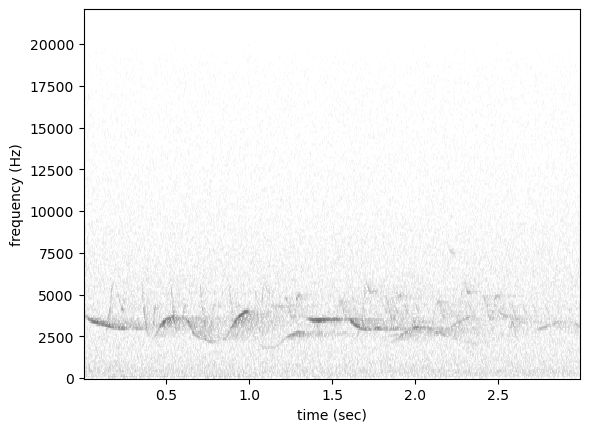

In [42]:
show_sample_from_df(train_df, 'absent')

# Shuffle the training data

In [43]:
train_df = train_df.sample(frac=1)
balanced_valid_df = balanced_valid_df.sample(frac=1)

# Drop the redundant absence class

In [44]:
train_df = train_df[["target_presence"]]
balanced_valid_df = balanced_valid_df[["target_presence"]]
train_df.columns, balanced_valid_df.columns

(Index(['target_presence'], dtype='object'),
 Index(['target_presence'], dtype='object'))

# Calculate recording durations for each recording in the training data
Some recordings might be corrupt and have zero samples. 

In [45]:
## Only need to do this if training fails due to zero length samples

# train_recording_durations = get_recording_durations(balanced_train_df)
# balanced_train_df['recording_duration'] = train_recording_durations
# balanced_train_df.loc[balanced_train_df['recording_duration'] < 3]

In [46]:
len(train_df)

7241

# Create a CNN

In [47]:
import timm
arch = timm.create_model('efficientnet_b0', pretrained=True, num_classes=1)

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/huggingface_hub/inference/_text_generation.py:121: PydanticDeprecatedSince20: Pydantic V1 style `@validator` validators are deprecated. You should migrate to Pydantic V2 style `@field_validator` validators, see the migration guide for more details. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.4/migration/
  @validator("best_of")
/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/huggingface_hub/inference/_text_generation.py:140: PydanticDeprecatedSince20: Pydantic V1 style `@validator` validators are deprecated. You should migrate to Pydantic V2 style `@field_validator` validators, see the migration guide for more details. Deprecated in Pydantic V2.0 to be removed in V3.0. See Pydantic V2 Migration Guide at https://errors.pydantic.dev/2.4/migration/
  @validator("repetition_penalty")
/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-pa

In [48]:
efficientnet=False

In [49]:
# Create a CNN object designed to recognize 3-second samples
from opensoundscape import CNN

# Use resnet18 or resnet34 architecture
if efficientnet:
    architecture = arch
else:
    architecture = 'resnet34'

# Can use this code to get your classes, if needed
class_list = list(train_df.columns)

model = CNN(
    architecture = architecture,
    classes = class_list,
    sample_duration=3,
    
)
# Set this to 'True' if there are more than one possible target class (present, absent, other) and only one label can be true. Set it to 'False' if there is only one output node - this will allow a threshold to be set on the output score and will allow use of sigmoid instead of softmax on the output layer. 
model.single_target = False

# model.lr_cooling_factor = 0.1
# model.lr_update_interval = 1
model.classes

['target_presence']

# Specify min and max frequencies for bandpass

In [50]:
if bandpass:
    model.preprocessor.pipeline.bandpass.params.min_f = min_freq
    model.preprocessor.pipeline.bandpass.params.max_f = max_freq
    model.preprocessor.pipeline.bandpass.params

# Inspect the input

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

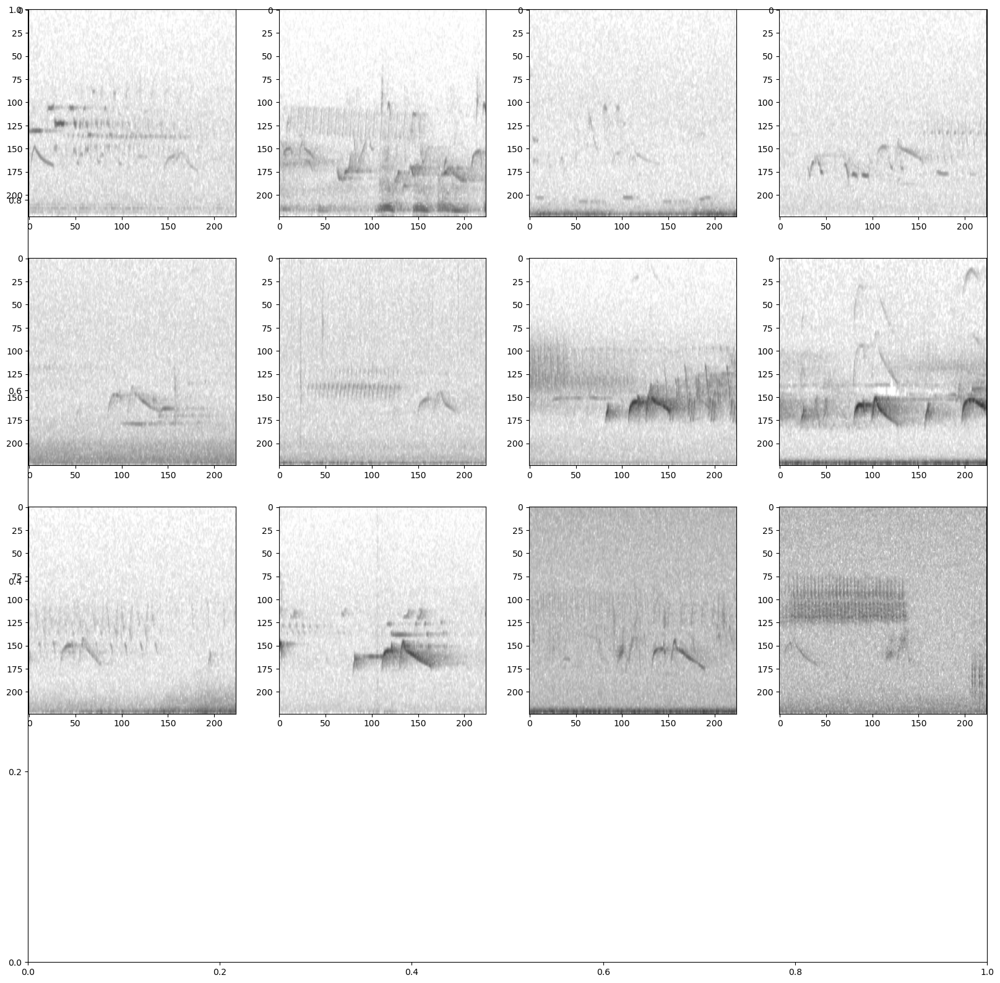

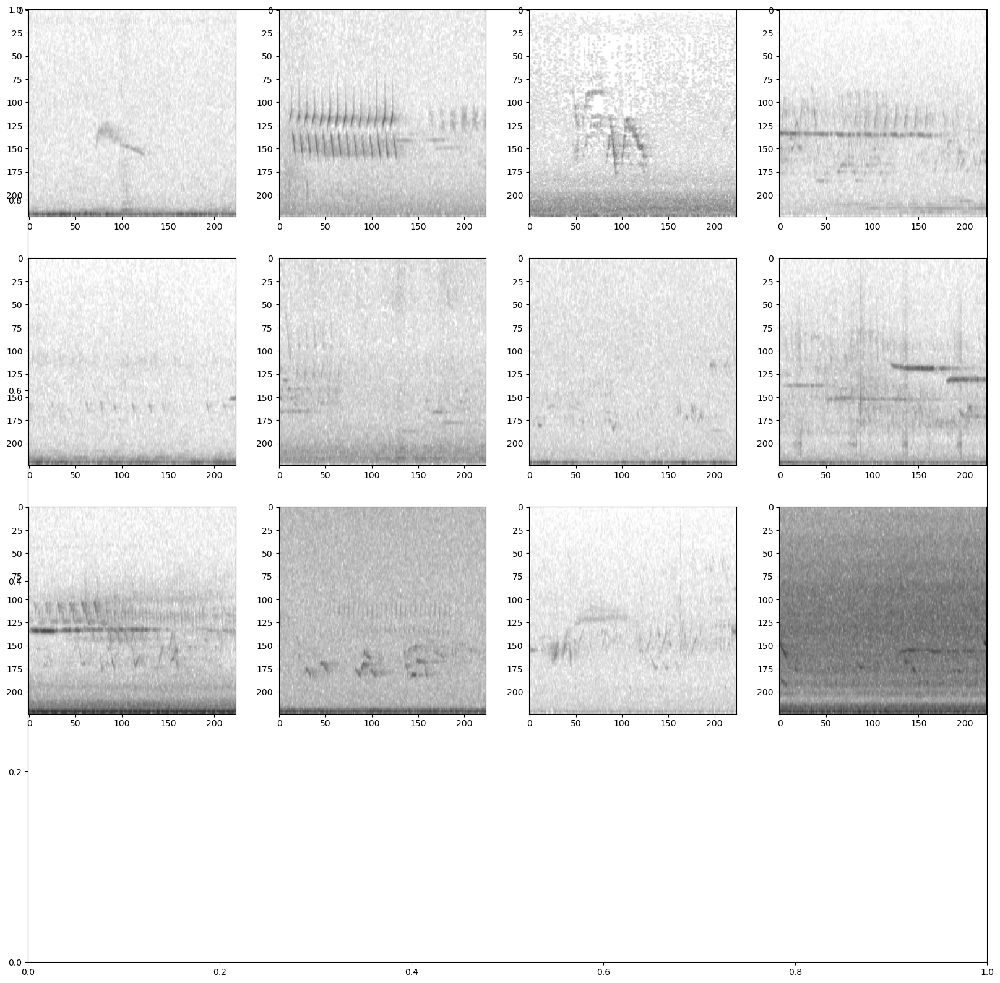

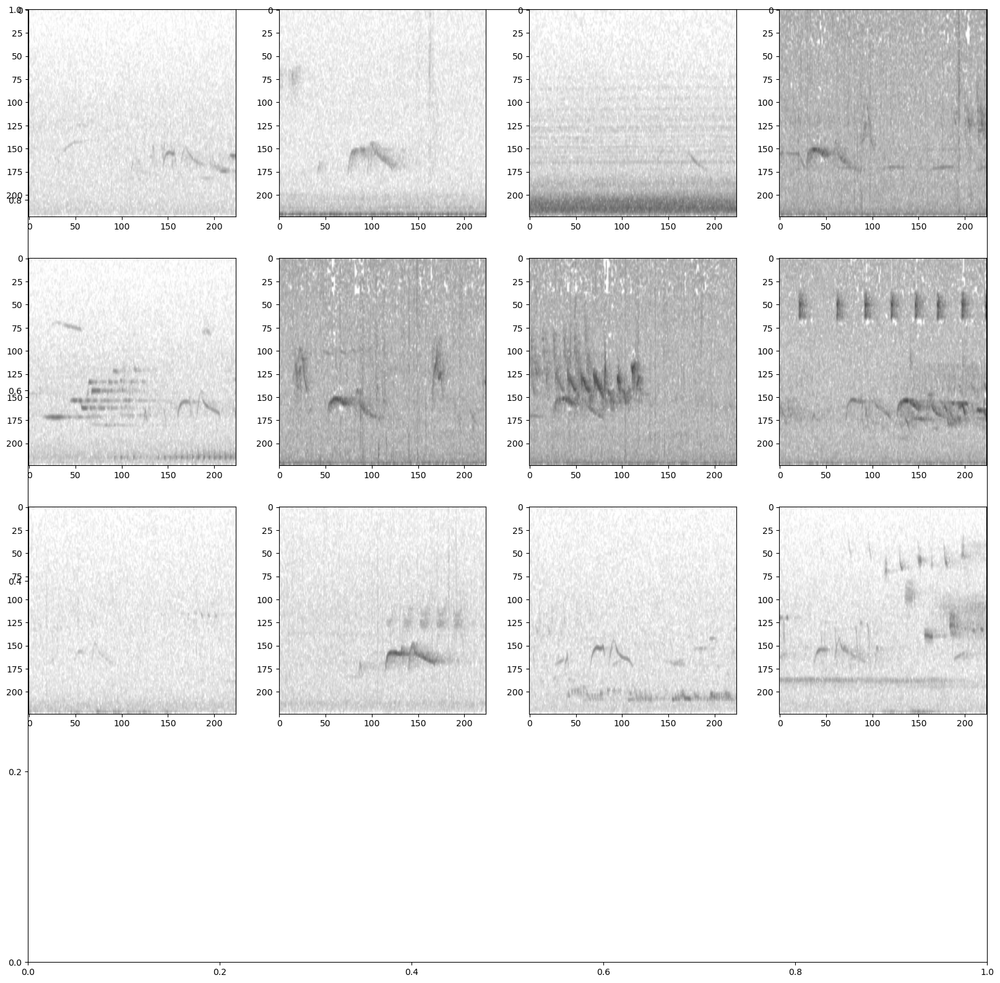

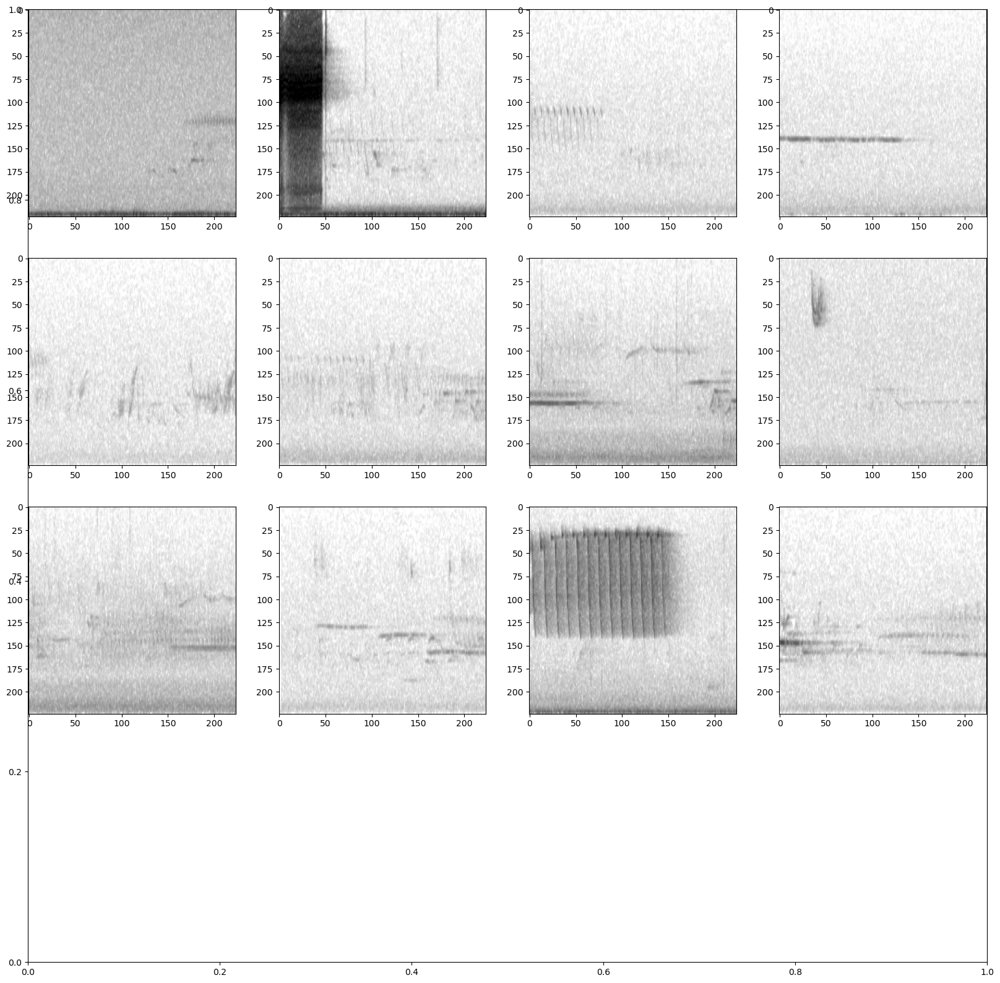

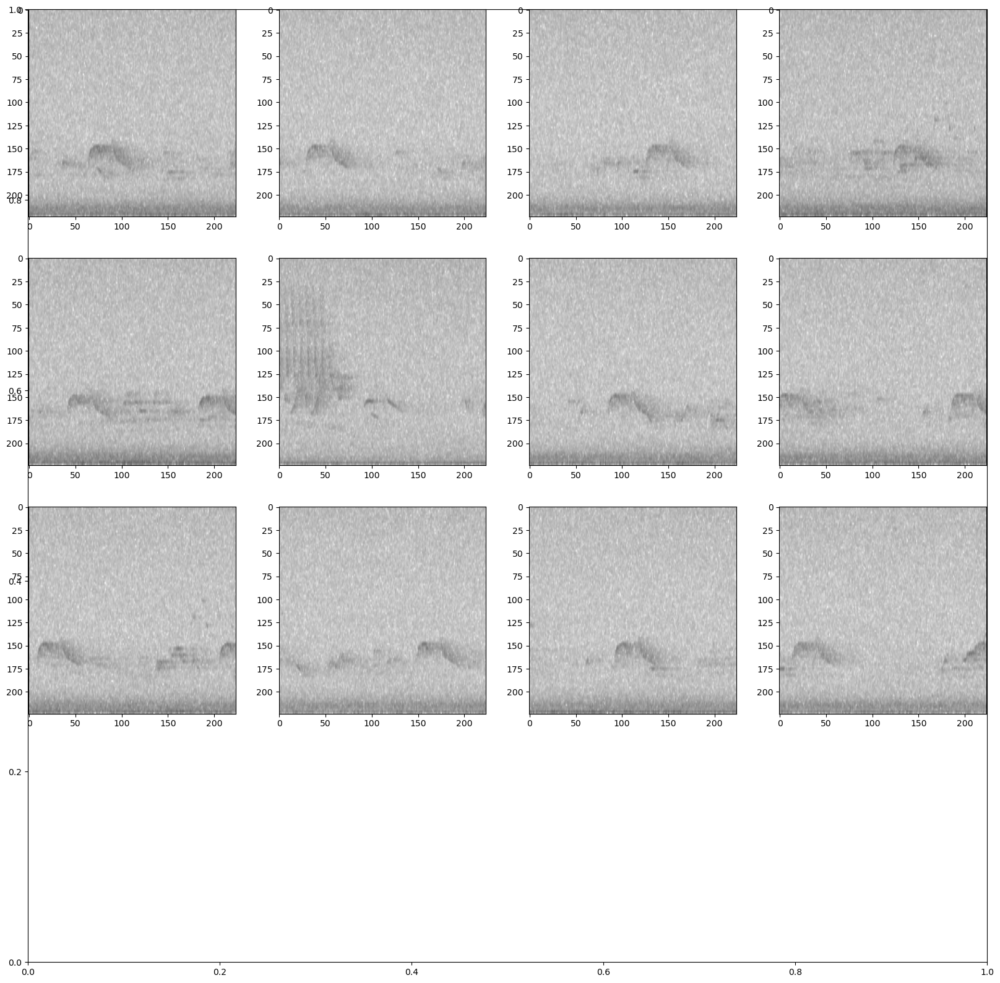

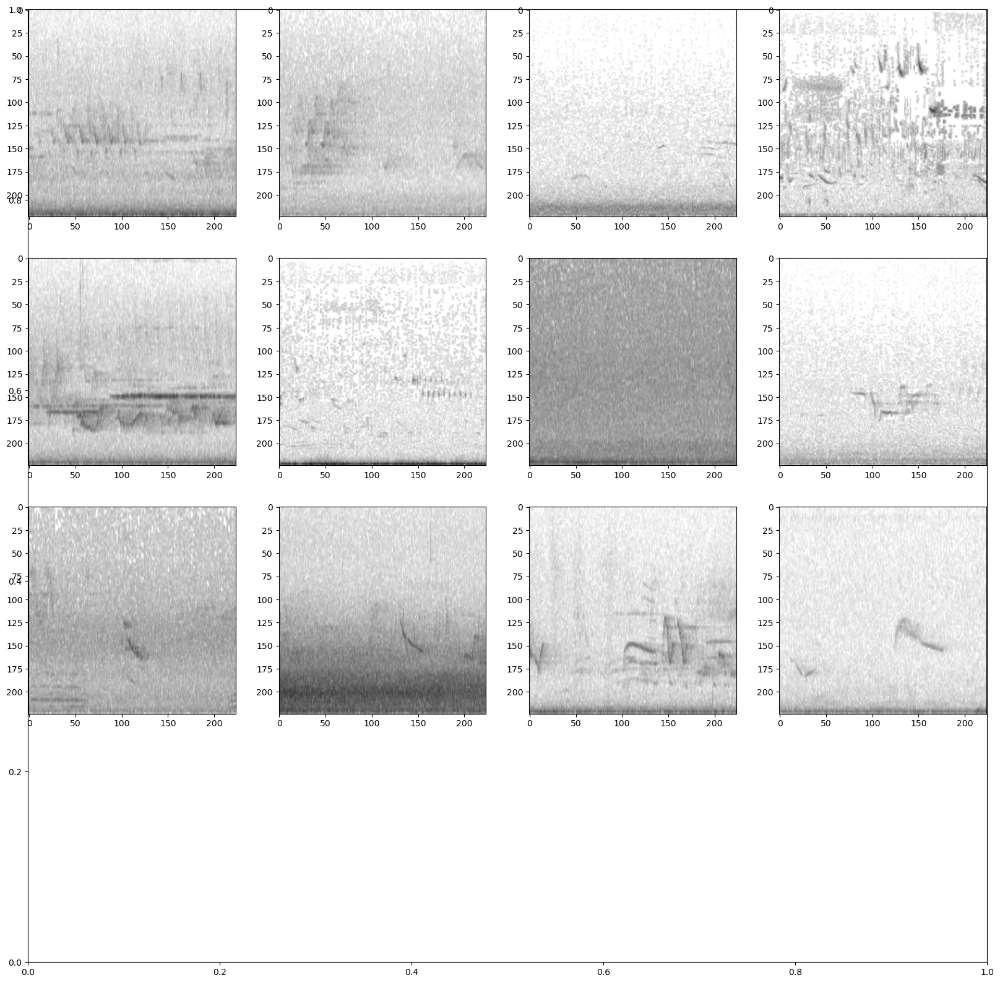

In [51]:
def inspect_input_samples(train_df, valid_df):
    present_t = train_df.loc[train_df.target_presence == 1]
    absent_t = train_df.loc[train_df.target_presence == 0]
    present_v = valid_df.loc[valid_df.target_presence == 1]
    absent_v = valid_df.loc[valid_df.target_presence == 0]
    present_other = other_habitats_df.loc[other_habitats_df.target_presence == 1]
    absent_other = other_habitats_df.loc[other_habitats_df.target_presence == 0]

    # Generate a dataset with the samples we wish to inspect and the model's preprocessor
    for df in [present_t, absent_t, present_v, absent_v, present_other, absent_other]:
        inspection_dataset = opso.AudioFileDataset(df.sample(12), model.preprocessor)
        inspection_dataset.bypass_augmentations = True

        samples = [sample.data for sample in inspection_dataset]
        _ = show_tensor_grid(samples, 4, invert=True)

inspect_input_samples(train_df, balanced_valid_df)


# Check for leakage

In [52]:
train_files = train_df.index.get_level_values("file")
valid_files = balanced_valid_df.index.get_level_values("file")
assert train_files.isin(valid_files).sum() == 0, "Train and validation sets have overlapping files"

In [53]:
model.optimizer_params['lr'] = learning_rate

In [54]:
model.network

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [55]:
class_list

['target_presence']

In [56]:
def show_sample_from_df(df=train_df, present=True,):
    if present:
        present = 1
    else: 
        present = 0
    sample = df.loc[df.target_presence == present].sample()
    path, offset, end_time = sample.index[0]
    duration = end_time - offset
    audio = opso.Audio.from_file(path, offset=offset, duration=duration)
    spec = opso.Spectrogram.from_audio(audio)
    audio.show_widget()
    spec.plot()


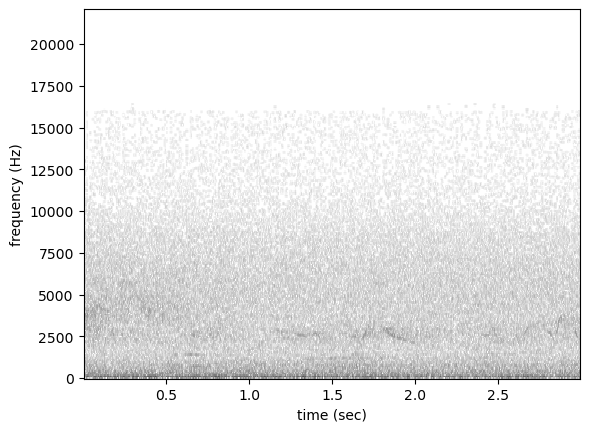

In [57]:
show_sample_from_df(df=other_valid, present=False)


In [58]:
print(f'model.device is: {model.device}')

model.device is: mps


In [59]:
Path.cwd() / "1.27-mjg-eda-use-cleaner-data.ipynb"

PosixPath('/Users/mikeg/code/machine_learning/osfl_cnn_recognizer/notebooks/exploratory_nbs/1.27-mjg-eda-use-cleaner-data.ipynb')

In [60]:
%set_env WANDB_NOTEBOOK_NAME={Path(Path.cwd() / "1.27-mjg-eda-use-cleaner-data.ipynb")}

env: WANDB_NOTEBOOK_NAME=/Users/mikeg/code/machine_learning/osfl_cnn_recognizer/notebooks/exploratory_nbs/1.27-mjg-eda-use-cleaner-data.ipynb


# Weights and biases initialization

In [61]:
import wandb
wandb.login()

wandb_session = wandb.init(

    project='OSFL',
    notes=description,
    config={
    "epochs":epochs,
    "n_samples_per_class": n_samples_per_class,
    "one_output_neuron": one_output_neuron,
    "random_seed": random_seed,
    # "positive_index": positive_index,
    "balanced_valid_set": True,
    
    }
)
wandb.config.learning_rate = learning_rate



wandb: Currently logged in as: mgallimore88. Use `wandb login --relogin` to force relogin
/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:77: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import HTML, display  # type: ignore


In [62]:
balanced_valid_df.value_counts()


target_presence
0.0                380
1.0                380
Name: count, dtype: int64

In [63]:
train_df.sample(15)

,,,target_presence
file,start_time,end_time,
../../data/raw/recordings/OSFL/recording-255457.mp3,94.5,97.5,1.0
../../data/raw/recordings/OSFL/recording-218207.flac,46.5,49.5,1.0
../../data/raw/recordings/OSFL/recording-103813.mp3,40.5,43.5,0.0
../../data/raw/recordings/OSFL/recording-331454.mp3,54.0,57.0,0.0
../../data/raw/recordings/OSFL/recording-553187.flac,0.0,3.0,1.0
../../data/raw/recordings/OSFL/recording-291672.mp3,207.0,210.0,0.0
../../data/raw/recordings/OSFL_other_habitats/recording-44989.mp3,9.0,12.0,0.0
../../data/raw/recordings/OSFL/recording-294104.mp3,6.0,9.0,1.0
../../data/raw/recordings/OSFL/recording-294419.mp3,28.5,31.5,1.0


In [64]:
train_df.value_counts()

target_presence
1.0                3787
0.0                3454
Name: count, dtype: int64

In [65]:
model.train(
    train_df,
    balanced_valid_df,
    epochs = epochs,
    batch_size = 64,
    num_workers = 2, #4 parallelized cpu tasks for preprocessing, Reduce if training quits unexpectedly
    log_interval = 10,
    save_interval = 1,
    invalid_samples_log='./invalid_samples.log',
    raise_errors=True,
    wandb_session = wandb_session,
    )


Training Epoch 0


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 0 [batch 0/114, 0.00%] 
	DistLoss: 0.749
Metrics:
Epoch: 0 [batch 10/114, 8.77%] 
	DistLoss: 0.758
Metrics:
Epoch: 0 [batch 20/114, 17.54%] 
	DistLoss: 0.687
Metrics:
Epoch: 0 [batch 30/114, 26.32%] 
	DistLoss: 0.644
Metrics:
Epoch: 0 [batch 40/114, 35.09%] 
	DistLoss: 0.613
Metrics:
Epoch: 0 [batch 50/114, 43.86%] 
	DistLoss: 0.562
Metrics:
Epoch: 0 [batch 60/114, 52.63%] 
	DistLoss: 0.527
Metrics:
Epoch: 0 [batch 70/114, 61.40%] 
	DistLoss: 0.502
Metrics:
Epoch: 0 [batch 80/114, 70.18%] 
	DistLoss: 0.476
Metrics:
Epoch: 0 [batch 90/114, 78.95%] 
	DistLoss: 0.458
Metrics:
Epoch: 0 [batch 100/114, 87.72%] 
	DistLoss: 0.440
Metrics:
Epoch: 0 [batch 110/114, 96.49%] 
	DistLoss: 0.427
Metrics:
Metrics:
	MAP: 0.908

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.992

Training Epoch 1


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 1 [batch 0/114, 0.00%] 
	DistLoss: 0.203
Metrics:
Epoch: 1 [batch 10/114, 8.77%] 
	DistLoss: 0.332
Metrics:
Epoch: 1 [batch 20/114, 17.54%] 
	DistLoss: 0.313
Metrics:
Epoch: 1 [batch 30/114, 26.32%] 
	DistLoss: 0.303
Metrics:
Epoch: 1 [batch 40/114, 35.09%] 
	DistLoss: 0.295
Metrics:
Epoch: 1 [batch 50/114, 43.86%] 
	DistLoss: 0.287
Metrics:
Epoch: 1 [batch 60/114, 52.63%] 
	DistLoss: 0.286
Metrics:
Epoch: 1 [batch 70/114, 61.40%] 
	DistLoss: 0.281
Metrics:
Epoch: 1 [batch 80/114, 70.18%] 
	DistLoss: 0.283
Metrics:
Epoch: 1 [batch 90/114, 78.95%] 
	DistLoss: 0.282
Metrics:
Epoch: 1 [batch 100/114, 87.72%] 
	DistLoss: 0.278
Metrics:
Epoch: 1 [batch 110/114, 96.49%] 
	DistLoss: 0.270
Metrics:
Metrics:
	MAP: 0.964

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.996

Training Epoch 2


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 2 [batch 0/114, 0.00%] 
	DistLoss: 0.350
Metrics:
Epoch: 2 [batch 10/114, 8.77%] 
	DistLoss: 0.266
Metrics:
Epoch: 2 [batch 20/114, 17.54%] 
	DistLoss: 0.233
Metrics:
Epoch: 2 [batch 30/114, 26.32%] 
	DistLoss: 0.223
Metrics:
Epoch: 2 [batch 40/114, 35.09%] 
	DistLoss: 0.221
Metrics:
Epoch: 2 [batch 50/114, 43.86%] 
	DistLoss: 0.223
Metrics:
Epoch: 2 [batch 60/114, 52.63%] 
	DistLoss: 0.223
Metrics:
Epoch: 2 [batch 70/114, 61.40%] 
	DistLoss: 0.218
Metrics:
Epoch: 2 [batch 80/114, 70.18%] 
	DistLoss: 0.217
Metrics:
Epoch: 2 [batch 90/114, 78.95%] 
	DistLoss: 0.216
Metrics:
Epoch: 2 [batch 100/114, 87.72%] 
	DistLoss: 0.219
Metrics:
Epoch: 2 [batch 110/114, 96.49%] 
	DistLoss: 0.218
Metrics:
Metrics:
	MAP: 0.976

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.996

Training Epoch 3


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 3 [batch 0/114, 0.00%] 
	DistLoss: 0.225
Metrics:
Epoch: 3 [batch 10/114, 8.77%] 
	DistLoss: 0.190
Metrics:
Epoch: 3 [batch 20/114, 17.54%] 
	DistLoss: 0.206
Metrics:
Epoch: 3 [batch 30/114, 26.32%] 
	DistLoss: 0.216
Metrics:
Epoch: 3 [batch 40/114, 35.09%] 
	DistLoss: 0.214
Metrics:
Epoch: 3 [batch 50/114, 43.86%] 
	DistLoss: 0.220
Metrics:
Epoch: 3 [batch 60/114, 52.63%] 
	DistLoss: 0.221
Metrics:
Epoch: 3 [batch 70/114, 61.40%] 
	DistLoss: 0.223
Metrics:
Epoch: 3 [batch 80/114, 70.18%] 
	DistLoss: 0.217
Metrics:
Epoch: 3 [batch 90/114, 78.95%] 
	DistLoss: 0.216
Metrics:
Epoch: 3 [batch 100/114, 87.72%] 
	DistLoss: 0.216
Metrics:
Epoch: 3 [batch 110/114, 96.49%] 
	DistLoss: 0.211
Metrics:
Metrics:
	MAP: 0.977

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.996

Training Epoch 4


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 4 [batch 0/114, 0.00%] 
	DistLoss: 0.068
Metrics:
Epoch: 4 [batch 10/114, 8.77%] 
	DistLoss: 0.232
Metrics:
Epoch: 4 [batch 20/114, 17.54%] 
	DistLoss: 0.217
Metrics:
Epoch: 4 [batch 30/114, 26.32%] 
	DistLoss: 0.205
Metrics:
Epoch: 4 [batch 40/114, 35.09%] 
	DistLoss: 0.206
Metrics:
Epoch: 4 [batch 50/114, 43.86%] 
	DistLoss: 0.203
Metrics:
Epoch: 4 [batch 60/114, 52.63%] 
	DistLoss: 0.205
Metrics:
Epoch: 4 [batch 70/114, 61.40%] 
	DistLoss: 0.204
Metrics:
Epoch: 4 [batch 80/114, 70.18%] 
	DistLoss: 0.203
Metrics:
Epoch: 4 [batch 90/114, 78.95%] 
	DistLoss: 0.203
Metrics:
Epoch: 4 [batch 100/114, 87.72%] 
	DistLoss: 0.203
Metrics:
Epoch: 4 [batch 110/114, 96.49%] 
	DistLoss: 0.204
Metrics:
Metrics:
	MAP: 0.979

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.998

Training Epoch 5


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 5 [batch 0/114, 0.00%] 
	DistLoss: 0.175
Metrics:
Epoch: 5 [batch 10/114, 8.77%] 
	DistLoss: 0.231
Metrics:
Epoch: 5 [batch 20/114, 17.54%] 
	DistLoss: 0.200
Metrics:
Epoch: 5 [batch 30/114, 26.32%] 
	DistLoss: 0.198
Metrics:
Epoch: 5 [batch 40/114, 35.09%] 
	DistLoss: 0.191
Metrics:
Epoch: 5 [batch 50/114, 43.86%] 
	DistLoss: 0.194
Metrics:
Epoch: 5 [batch 60/114, 52.63%] 
	DistLoss: 0.191
Metrics:
Epoch: 5 [batch 70/114, 61.40%] 
	DistLoss: 0.186
Metrics:
Epoch: 5 [batch 80/114, 70.18%] 
	DistLoss: 0.188
Metrics:
Epoch: 5 [batch 90/114, 78.95%] 
	DistLoss: 0.189
Metrics:
Epoch: 5 [batch 100/114, 87.72%] 
	DistLoss: 0.189
Metrics:
Epoch: 5 [batch 110/114, 96.49%] 
	DistLoss: 0.189
Metrics:
Metrics:
	MAP: 0.982

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.997

Training Epoch 6


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 6 [batch 0/114, 0.00%] 
	DistLoss: 0.187
Metrics:
Epoch: 6 [batch 10/114, 8.77%] 
	DistLoss: 0.146
Metrics:
Epoch: 6 [batch 20/114, 17.54%] 
	DistLoss: 0.176
Metrics:
Epoch: 6 [batch 30/114, 26.32%] 
	DistLoss: 0.179
Metrics:
Epoch: 6 [batch 40/114, 35.09%] 
	DistLoss: 0.177
Metrics:
Epoch: 6 [batch 50/114, 43.86%] 
	DistLoss: 0.171
Metrics:
Epoch: 6 [batch 60/114, 52.63%] 
	DistLoss: 0.172
Metrics:
Epoch: 6 [batch 70/114, 61.40%] 
	DistLoss: 0.171
Metrics:
Epoch: 6 [batch 80/114, 70.18%] 
	DistLoss: 0.176
Metrics:
Epoch: 6 [batch 90/114, 78.95%] 
	DistLoss: 0.181
Metrics:
Epoch: 6 [batch 100/114, 87.72%] 
	DistLoss: 0.183
Metrics:
Epoch: 6 [batch 110/114, 96.49%] 
	DistLoss: 0.181
Metrics:
Metrics:
	MAP: 0.983

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.998

Training Epoch 7


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 7 [batch 0/114, 0.00%] 
	DistLoss: 0.175
Metrics:
Epoch: 7 [batch 10/114, 8.77%] 
	DistLoss: 0.182
Metrics:
Epoch: 7 [batch 20/114, 17.54%] 
	DistLoss: 0.183
Metrics:
Epoch: 7 [batch 30/114, 26.32%] 
	DistLoss: 0.173
Metrics:
Epoch: 7 [batch 40/114, 35.09%] 
	DistLoss: 0.165
Metrics:
Epoch: 7 [batch 50/114, 43.86%] 
	DistLoss: 0.159
Metrics:
Epoch: 7 [batch 60/114, 52.63%] 
	DistLoss: 0.153
Metrics:
Epoch: 7 [batch 70/114, 61.40%] 
	DistLoss: 0.159
Metrics:
Epoch: 7 [batch 80/114, 70.18%] 
	DistLoss: 0.165
Metrics:
Epoch: 7 [batch 90/114, 78.95%] 
	DistLoss: 0.166
Metrics:
Epoch: 7 [batch 100/114, 87.72%] 
	DistLoss: 0.169
Metrics:
Epoch: 7 [batch 110/114, 96.49%] 
	DistLoss: 0.170
Metrics:
Metrics:
	MAP: 0.985

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.999

Training Epoch 8


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 8 [batch 0/114, 0.00%] 
	DistLoss: 0.163
Metrics:
Epoch: 8 [batch 10/114, 8.77%] 
	DistLoss: 0.191
Metrics:
Epoch: 8 [batch 20/114, 17.54%] 
	DistLoss: 0.165
Metrics:
Epoch: 8 [batch 30/114, 26.32%] 
	DistLoss: 0.166
Metrics:
Epoch: 8 [batch 40/114, 35.09%] 
	DistLoss: 0.165
Metrics:
Epoch: 8 [batch 50/114, 43.86%] 
	DistLoss: 0.160
Metrics:
Epoch: 8 [batch 60/114, 52.63%] 
	DistLoss: 0.155
Metrics:
Epoch: 8 [batch 70/114, 61.40%] 
	DistLoss: 0.149
Metrics:
Epoch: 8 [batch 80/114, 70.18%] 
	DistLoss: 0.154
Metrics:
Epoch: 8 [batch 90/114, 78.95%] 
	DistLoss: 0.157
Metrics:
Epoch: 8 [batch 100/114, 87.72%] 
	DistLoss: 0.156
Metrics:
Epoch: 8 [batch 110/114, 96.49%] 
	DistLoss: 0.154
Metrics:
Metrics:
	MAP: 0.987

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.997

Training Epoch 9


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 9 [batch 0/114, 0.00%] 
	DistLoss: 0.236
Metrics:
Epoch: 9 [batch 10/114, 8.77%] 
	DistLoss: 0.153
Metrics:
Epoch: 9 [batch 20/114, 17.54%] 
	DistLoss: 0.132
Metrics:
Epoch: 9 [batch 30/114, 26.32%] 
	DistLoss: 0.135
Metrics:
Epoch: 9 [batch 40/114, 35.09%] 
	DistLoss: 0.140
Metrics:
Epoch: 9 [batch 50/114, 43.86%] 
	DistLoss: 0.140
Metrics:
Epoch: 9 [batch 60/114, 52.63%] 
	DistLoss: 0.139
Metrics:
Epoch: 9 [batch 70/114, 61.40%] 
	DistLoss: 0.144
Metrics:
Epoch: 9 [batch 80/114, 70.18%] 
	DistLoss: 0.144
Metrics:
Epoch: 9 [batch 90/114, 78.95%] 
	DistLoss: 0.145
Metrics:
Epoch: 9 [batch 100/114, 87.72%] 
	DistLoss: 0.144
Metrics:
Epoch: 9 [batch 110/114, 96.49%] 
	DistLoss: 0.145
Metrics:
Metrics:
	MAP: 0.989

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.997

Training Epoch 10


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 10 [batch 0/114, 0.00%] 
	DistLoss: 0.133
Metrics:
Epoch: 10 [batch 10/114, 8.77%] 
	DistLoss: 0.135
Metrics:
Epoch: 10 [batch 20/114, 17.54%] 
	DistLoss: 0.152
Metrics:
Epoch: 10 [batch 30/114, 26.32%] 
	DistLoss: 0.160
Metrics:
Epoch: 10 [batch 40/114, 35.09%] 
	DistLoss: 0.164
Metrics:
Epoch: 10 [batch 50/114, 43.86%] 
	DistLoss: 0.159
Metrics:
Epoch: 10 [batch 60/114, 52.63%] 
	DistLoss: 0.159
Metrics:
Epoch: 10 [batch 70/114, 61.40%] 
	DistLoss: 0.158
Metrics:
Epoch: 10 [batch 80/114, 70.18%] 
	DistLoss: 0.157
Metrics:
Epoch: 10 [batch 90/114, 78.95%] 
	DistLoss: 0.154
Metrics:
Epoch: 10 [batch 100/114, 87.72%] 
	DistLoss: 0.150
Metrics:
Epoch: 10 [batch 110/114, 96.49%] 
	DistLoss: 0.147
Metrics:
Metrics:
	MAP: 0.989

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.998

Training Epoch 11


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 11 [batch 0/114, 0.00%] 
	DistLoss: 0.175
Metrics:
Epoch: 11 [batch 10/114, 8.77%] 
	DistLoss: 0.112
Metrics:
Epoch: 11 [batch 20/114, 17.54%] 
	DistLoss: 0.120
Metrics:
Epoch: 11 [batch 30/114, 26.32%] 
	DistLoss: 0.119
Metrics:
Epoch: 11 [batch 40/114, 35.09%] 
	DistLoss: 0.131
Metrics:
Epoch: 11 [batch 50/114, 43.86%] 
	DistLoss: 0.137
Metrics:
Epoch: 11 [batch 60/114, 52.63%] 
	DistLoss: 0.138
Metrics:
Epoch: 11 [batch 70/114, 61.40%] 
	DistLoss: 0.138
Metrics:
Epoch: 11 [batch 80/114, 70.18%] 
	DistLoss: 0.138
Metrics:
Epoch: 11 [batch 90/114, 78.95%] 
	DistLoss: 0.139
Metrics:
Epoch: 11 [batch 100/114, 87.72%] 
	DistLoss: 0.145
Metrics:
Epoch: 11 [batch 110/114, 96.49%] 
	DistLoss: 0.145
Metrics:
Metrics:
	MAP: 0.989

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.998

Training Epoch 12


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 12 [batch 0/114, 0.00%] 
	DistLoss: 0.137
Metrics:
Epoch: 12 [batch 10/114, 8.77%] 
	DistLoss: 0.172
Metrics:
Epoch: 12 [batch 20/114, 17.54%] 
	DistLoss: 0.155
Metrics:
Epoch: 12 [batch 30/114, 26.32%] 
	DistLoss: 0.143
Metrics:
Epoch: 12 [batch 40/114, 35.09%] 
	DistLoss: 0.142
Metrics:
Epoch: 12 [batch 50/114, 43.86%] 
	DistLoss: 0.147
Metrics:
Epoch: 12 [batch 60/114, 52.63%] 
	DistLoss: 0.148
Metrics:
Epoch: 12 [batch 70/114, 61.40%] 
	DistLoss: 0.149
Metrics:
Epoch: 12 [batch 80/114, 70.18%] 
	DistLoss: 0.149
Metrics:
Epoch: 12 [batch 90/114, 78.95%] 
	DistLoss: 0.152
Metrics:
Epoch: 12 [batch 100/114, 87.72%] 
	DistLoss: 0.150
Metrics:
Epoch: 12 [batch 110/114, 96.49%] 
	DistLoss: 0.147
Metrics:
Metrics:
	MAP: 0.988

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.999

Training Epoch 13


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 13 [batch 0/114, 0.00%] 
	DistLoss: 0.091
Metrics:
Epoch: 13 [batch 10/114, 8.77%] 
	DistLoss: 0.160
Metrics:
Epoch: 13 [batch 20/114, 17.54%] 
	DistLoss: 0.150
Metrics:
Epoch: 13 [batch 30/114, 26.32%] 
	DistLoss: 0.146
Metrics:
Epoch: 13 [batch 40/114, 35.09%] 
	DistLoss: 0.147
Metrics:
Epoch: 13 [batch 50/114, 43.86%] 
	DistLoss: 0.153
Metrics:
Epoch: 13 [batch 60/114, 52.63%] 
	DistLoss: 0.153
Metrics:
Epoch: 13 [batch 70/114, 61.40%] 
	DistLoss: 0.149
Metrics:
Epoch: 13 [batch 80/114, 70.18%] 
	DistLoss: 0.147
Metrics:
Epoch: 13 [batch 90/114, 78.95%] 
	DistLoss: 0.149
Metrics:
Epoch: 13 [batch 100/114, 87.72%] 
	DistLoss: 0.147
Metrics:
Epoch: 13 [batch 110/114, 96.49%] 
	DistLoss: 0.145
Metrics:
Metrics:
	MAP: 0.989

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.996

Training Epoch 14


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 14 [batch 0/114, 0.00%] 
	DistLoss: 0.114
Metrics:
Epoch: 14 [batch 10/114, 8.77%] 
	DistLoss: 0.117
Metrics:
Epoch: 14 [batch 20/114, 17.54%] 
	DistLoss: 0.121
Metrics:
Epoch: 14 [batch 30/114, 26.32%] 
	DistLoss: 0.132
Metrics:
Epoch: 14 [batch 40/114, 35.09%] 
	DistLoss: 0.135
Metrics:
Epoch: 14 [batch 50/114, 43.86%] 
	DistLoss: 0.139
Metrics:
Epoch: 14 [batch 60/114, 52.63%] 
	DistLoss: 0.138
Metrics:
Epoch: 14 [batch 70/114, 61.40%] 
	DistLoss: 0.136
Metrics:
Epoch: 14 [batch 80/114, 70.18%] 
	DistLoss: 0.143
Metrics:
Epoch: 14 [batch 90/114, 78.95%] 
	DistLoss: 0.143
Metrics:
Epoch: 14 [batch 100/114, 87.72%] 
	DistLoss: 0.143
Metrics:
Epoch: 14 [batch 110/114, 96.49%] 
	DistLoss: 0.142
Metrics:
Metrics:
	MAP: 0.989

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.997

Training Epoch 15


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 15 [batch 0/114, 0.00%] 
	DistLoss: 0.166
Metrics:
Epoch: 15 [batch 10/114, 8.77%] 
	DistLoss: 0.127
Metrics:
Epoch: 15 [batch 20/114, 17.54%] 
	DistLoss: 0.119
Metrics:
Epoch: 15 [batch 30/114, 26.32%] 
	DistLoss: 0.116
Metrics:
Epoch: 15 [batch 40/114, 35.09%] 
	DistLoss: 0.117
Metrics:
Epoch: 15 [batch 50/114, 43.86%] 
	DistLoss: 0.123
Metrics:
Epoch: 15 [batch 60/114, 52.63%] 
	DistLoss: 0.122
Metrics:
Epoch: 15 [batch 70/114, 61.40%] 
	DistLoss: 0.126
Metrics:
Epoch: 15 [batch 80/114, 70.18%] 
	DistLoss: 0.129
Metrics:
Epoch: 15 [batch 90/114, 78.95%] 
	DistLoss: 0.129
Metrics:
Epoch: 15 [batch 100/114, 87.72%] 
	DistLoss: 0.130
Metrics:
Epoch: 15 [batch 110/114, 96.49%] 
	DistLoss: 0.133
Metrics:
Metrics:
	MAP: 0.991

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

Metrics:
	MAP: 0.998

Training Epoch 16


  0%|          | 0/114 [00:00<?, ?it/s]

Epoch: 16 [batch 0/114, 0.00%] 
	DistLoss: 0.131
Metrics:
Epoch: 16 [batch 10/114, 8.77%] 
	DistLoss: 0.131
Metrics:
Epoch: 16 [batch 20/114, 17.54%] 
	DistLoss: 0.143
Metrics:
Epoch: 16 [batch 30/114, 26.32%] 
	DistLoss: 0.131
Metrics:
Epoch: 16 [batch 40/114, 35.09%] 
	DistLoss: 0.132
Metrics:
Epoch: 16 [batch 50/114, 43.86%] 
	DistLoss: 0.132
Metrics:
Epoch: 16 [batch 60/114, 52.63%] 
	DistLoss: 0.132
Metrics:
Epoch: 16 [batch 70/114, 61.40%] 
	DistLoss: 0.132
Metrics:
Epoch: 16 [batch 80/114, 70.18%] 
	DistLoss: 0.134
Metrics:
Epoch: 16 [batch 90/114, 78.95%] 
	DistLoss: 0.134
Metrics:
Epoch: 16 [batch 100/114, 87.72%] 
	DistLoss: 0.140
Metrics:
Epoch: 16 [batch 110/114, 96.49%] 
	DistLoss: 0.137
Metrics:
Metrics:
	MAP: 0.990

Validation.


  0%|          | 0/12 [00:00<?, ?it/s]

RuntimeError: DataLoader worker (pid(s) 48840) exited unexpectedly

In [66]:
# Load the checkpoint from the best epoch
model = opso.load_model("best.model")

# Show metrics per epoch

In [67]:
model.valid_metrics

{0: {'target_presence': {'au_roc': 0.9923961218836564,
   'avg_precision': 0.9920267985738667,
   'precision': 0.9752747252747253,
   'recall': 0.9342105263157895,
   'f1': 0.9543010752688171,
   'support': 380},
  'precision': 0.9560717060717061,
  'recall': 0.9552631578947368,
  'f1': 0.9552433211395632,
  'jaccard': 0.9143228918721635,
  'hamming_loss': 0.04473684210526316,
  'map': 0.9920267985738667,
  'au_roc': 0.9923961218836564},
 1: {'target_presence': {'au_roc': 0.9963365650969529,
   'avg_precision': 0.9961710807405486,
   'precision': 0.9685863874345549,
   'recall': 0.9736842105263158,
   'f1': 0.9711286089238845,
   'support': 380},
  'precision': 0.9710656804897642,
  'recall': 0.9710526315789474,
  'f1': 0.9710524311110189,
  'jaccard': 0.9437336473050759,
  'hamming_loss': 0.02894736842105263,
  'map': 0.9961710807405486,
  'au_roc': 0.9963365650969529},
 2: {'target_presence': {'au_roc': 0.9961842105263158,
   'avg_precision': 0.9961046712378973,
   'precision': 0.975

In [68]:
model.train_metrics

{0: {'target_presence': {'au_roc': 0.8809906318648093,
   'avg_precision': 0.907738877020002,
   'precision': 0.7283921382903149,
   'recall': 0.8905616676317313,
   'f1': 0.801354695844731,
   'support': 3454},
  'precision': 0.8015718146719963,
  'recall': 0.7938416999368056,
  'f1': 0.7886273846600582,
  'jaccard': 0.6512019282827236,
  'hamming_loss': 0.21060626985223035,
  'map': 0.907738877020002,
  'au_roc': 0.8809906318648093},
 1: {'target_presence': {'au_roc': 0.9512244292905254,
   'avg_precision': 0.9637576354916874,
   'precision': 0.835282155566853,
   'recall': 0.9513607411696584,
   'f1': 0.8895506226312941,
   'support': 3454},
  'precision': 0.892240412527908,
  'recall': 0.8901245216278713,
  'f1': 0.8872619197171131,
  'jaccard': 0.7973757674866135,
  'hamming_loss': 0.11269161717994752,
  'map': 0.9637576354916874,
  'au_roc': 0.9512244292905254},
 2: {'target_presence': {'au_roc': 0.968752623220052,
   'avg_precision': 0.9761855212913843,
   'precision': 0.8695766

# Plot a confusion matrix on balanced validation set 
There are equal numbers of examples from each class. 

In [69]:
scores_df = model.predict(balanced_valid_df, activation_layer='sigmoid')

  0%|          | 0/760 [00:00<?, ?it/s]

In [70]:
def get_binary_predictions(target_df, model_predictions_df, threshold=0.5):
    '''
    Calculate the binary predictions needed for confusion matrix and other metrics. 
    target_df: DataFrame with labels in the target_presence column
    model_predictions_df: DataFrame with model predictions in target_presence column
    '''
    targets = target_df.target_presence.values
    scores = model_predictions_df.target_presence.values
    binary_preds = (scores > threshold).astype(float)
    return binary_preds, targets, scores


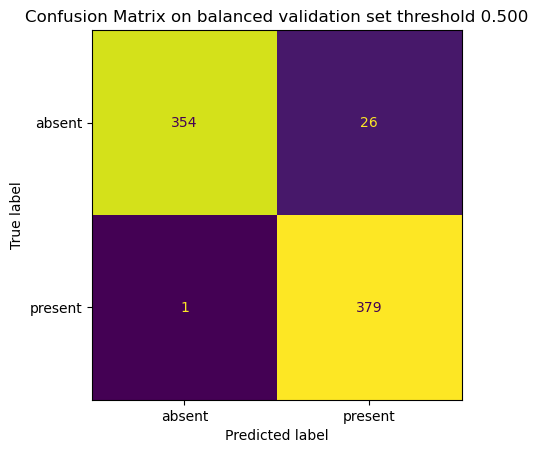

In [71]:
threshold = 0.5
# Calculate the confusion matrix
binary_preds, targets, scores = get_binary_predictions(balanced_valid_df, scores_df, threshold=threshold)
cm = sklearn.metrics.confusion_matrix(targets, binary_preds)
cm_display = opso.metrics.M.ConfusionMatrixDisplay(cm, display_labels=["absent", "present"])

# Plot the confusion matrix
fig, ax = plt.subplots()
ax.set_title(f"Confusion Matrix on balanced validation set threshold {threshold:.3f}")
cm_display.plot(ax=ax, colorbar=False)

# Look at the metrics across thresholds
for the balanced validation set

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


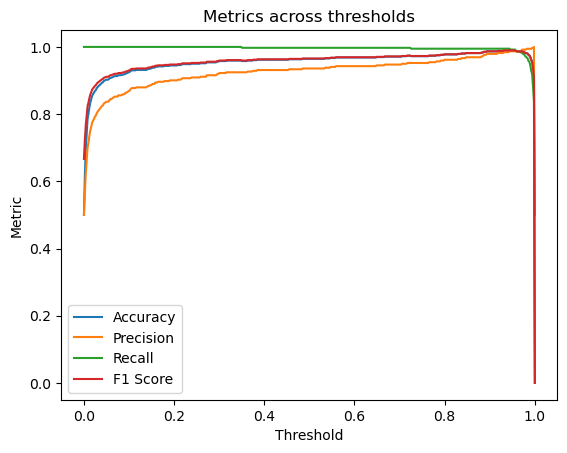

In [72]:
plot_data, legend = plot_metrics_across_thresholds(pd.DataFrame({"label":targets, "present_pred":scores}))
thresholds, accuracies, precisions, recalls, f1s = zip(*list(plot_data))

In [73]:
cm

array([[354,  26],
       [  1, 379]])

In [74]:
# log confusion matrix to wandb as a table
wandb.log({"validation.confusion_matrix": cm})


In [75]:
def log_single_metric(metric, name):
    data = [[x, y] for (x, y) in zip(thresholds, metric)]
    table = wandb.Table(data=data, columns=["x", "y"])
    wandb.log(
        {
            f"custom {name}": wandb.plot.line(
                table, "x", "y", title=f"Custom {name} vs threshold plot"
            )
        }
    )
log_single_metric(accuracies, "accuracy")
log_single_metric(precisions, "precision")
log_single_metric(recalls, "recall")
log_single_metric(f1s, "f1")


# Make predictions and plot confusion matrix on the full validation set
During training we only looked at a subset of the validation set values. 

In [76]:
scores_df = model.predict(valid_df, activation_layer='sigmoid')


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/10334 [00:00<?, ?it/s]

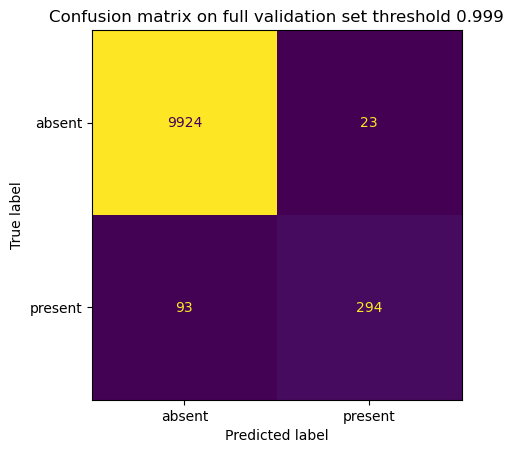

In [77]:
threshold = 0.999
# Calculate the confusion matrix
binary_preds, targets, scores = get_binary_predictions(valid_df, scores_df, threshold=threshold)
cm = sklearn.metrics.confusion_matrix(targets, binary_preds)
cm_display = opso.metrics.M.ConfusionMatrixDisplay(cm, display_labels=["absent", "present"])

# Plot the confusion matrix
fig, ax = plt.subplots()
ax.set_title(f"Confusion matrix on full validation set threshold {threshold:.3f}")
cm_display.plot(ax=ax, colorbar=False)

# Interactive confusion matrix


In [78]:
import ipywidgets as widgets
def show_cm(threshold):
    # Calculate the confusion matrix
    binary_preds, targets, scores = get_binary_predictions(valid_df, scores_df, threshold=threshold)
    cm = sklearn.metrics.confusion_matrix(targets, binary_preds)
    cm_display = opso.metrics.M.ConfusionMatrixDisplay(cm, display_labels=["absent", "present"])

    # Plot the confusion matrix
    fig, ax = plt.subplots()
    ax.set_title(f"Confusion matrix on full validation set threshold {threshold:.4f}")
    cm_display.plot(ax=ax, colorbar=False)

from ipywidgets import interact
interact(show_cm, threshold=widgets.FloatSlider(min=0.0, max=1.0, step=0.0001, value=0.5))
# show_cm(0.5)

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/ipywidgets/widgets/interaction.py:43: DeprecationWarning: `ipykernel.pylab.backend_inline` is deprecated, directly use `matplotlib_inline.backend_inline`
  from ipykernel.pylab.backend_inline import flush_figures


interactive(children=(FloatSlider(value=0.5, description='threshold', max=1.0, step=0.0001), Output()), _dom_c…

<function __main__.show_cm(threshold)>

# Look at the metrics across thresholds
for the full validation set

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


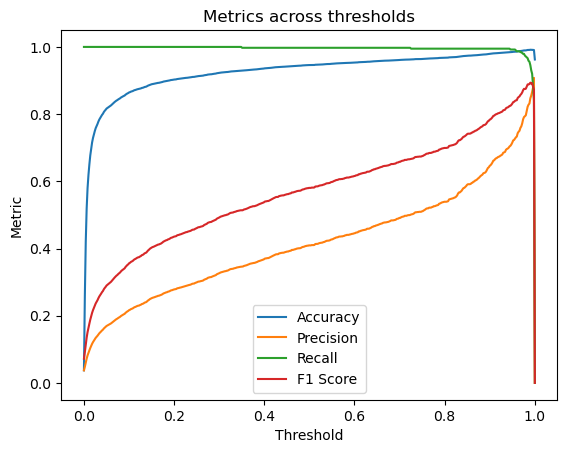

In [79]:
plot_data, legend = plot_metrics_across_thresholds(pd.DataFrame({"label":targets, "present_pred":scores}))
thresholds, accuracies, precisions, recalls, f1s = zip(*list(plot_data))

log_single_metric(accuracies, "accuracy_full_set")
log_single_metric(precisions, "precision_full_set")
log_single_metric(recalls, "recall_full_set")
log_single_metric(f1s, "f1_full_set")

# Plot a confusion matrix on the out of habitat samples
These samples all previously scored above 0.8

In [80]:
scores_df = model.predict(other_valid, activation_layer='sigmoid')

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/opensoundscape/ml/cnn.py:201: UserWarning: The columns of input samples df differ from `model.classes`.
  warnings.warn(


  0%|          | 0/268 [00:00<?, ?it/s]

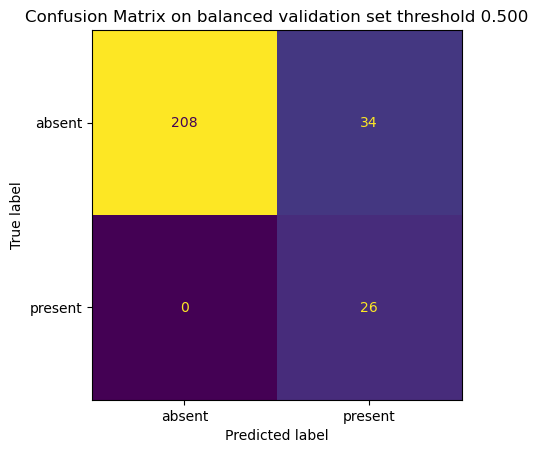

In [81]:
threshold = 0.5
# Calculate the confusion matrix
binary_preds, targets, scores = get_binary_predictions(other_valid, scores_df, threshold=threshold)
cm = sklearn.metrics.confusion_matrix(targets, binary_preds)
cm_display = opso.metrics.M.ConfusionMatrixDisplay(cm, display_labels=["absent", "present"])

# Plot the confusion matrix
fig, ax = plt.subplots()
ax.set_title(f"Confusion Matrix on balanced validation set threshold {threshold:.3f}")
cm_display.plot(ax=ax, colorbar=False)

# Result: 
Training on 1700 from each class produces a model with high precision and recall. 

# Too good to be true?
Load the results into notebook 1.21 for sanity check. There you can load a pretrained model, make predictions on the validation set, and look at predictions in order of highest error for each class. 

# Save the best model to disk


In [82]:
import datetime
dt = datetime.datetime.now().isoformat()
best_model = opso.cnn.load_model("best.model")
best_model.save(model_save_path / f"{wandb.run.name}efficientnet_other_habitats.model")

In [83]:
train_df.value_counts()


target_presence
1.0                3787
0.0                3454
Name: count, dtype: int64

In [84]:
wandb.finish()

/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:89: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display


/Users/mikeg/miniforge3/envs/osfl2/lib/python3.10/site-packages/wandb/sdk/lib/ipython.py:77: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import HTML, display  # type: ignore


epoch,▁▁▂▂▃▃▄▄▅▅▆▆▇▇██
loss,█▄▃▃▃▂▂▂▂▁▁▁▁▁▁▁▁
epoch,15
loss,0.13634
